# SETUP

## Check environment

In [1]:
USE_GPU = True

## Libraries

In [2]:
# System
import os
import glob
import shutil
import copy
import re
from datetime import datetime
import logging
import sys

# Data
import numpy as np
import pandas as pd

# Visualization
import seaborn as sns
%matplotlib inline
import matplotlib.pyplot as plt
plt.rcParams.update({'figure.max_open_warning': 0})
from tqdm.notebook import tqdm

# Data processing
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, TimeSeriesSplit, cross_val_score
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
import joblib

# Model
import tensorflow as tf
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, root_mean_squared_error, mean_absolute_percentage_error
from scipy.stats import pearsonr
from keras import Input, Model, Sequential
from keras.layers import Dense, LSTM, RepeatVector, TimeDistributed, Dropout, GRU, Conv1D, MaxPooling1D, Flatten
from keras.utils import plot_model
from keras.saving import load_model
from keras.callbacks import LearningRateScheduler, ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from keras.optimizers import Adam
from keras.losses import MeanAbsoluteError
from keras.losses import MeanAbsoluteError, MeanSquaredError
import keras.backend as K
from tqdm.keras import TqdmCallback
from tensorflow.keras import optimizers

# Append the custom libraries to system path
sys.path.append("/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project")

# Configure device
if not USE_GPU:
    print("Using CPU to train")
    os.environ['CUDA_VISIBLE_DEVICES'] = '-1'
else:
    print("Using GPU to train")
    os.environ['TF_FORCE_GPU_ALLOW_GROWTH'] = "true"

# Custom libraries written by myself
from src.plot import plot_1_data, plot_2_data, plot_3_data, plot_prediction, plot_learning_curves
from src.reduction_model.lstm_s2s import LSTMSeq2SeqReduction
from src.reduction_model.gru_s2s import GRUSeq2SeqReduction
from src.reduction_model.cnnlstm_s2s import CNNLSTMSeq2SeqReduction
from src.prediction_model.lstm import LSTMPrediction, inferenceLSTM
from src.loop_model import generate_loopresults, choose_the_best
from src.reduce_data_utils import prepareReducedData
from src.data_utils import mice
from src.time_series_utils import splitTrainValidationTestTimeSeries, reframePastFuture, padPastFuture

# Checking Tensorflow
print(f"Tensorflow version: {tf.__version__}, GPUs: {tf.config.list_physical_devices('GPU')}")

E0000 00:00:1763643033.738074   11771 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1763643033.744628   11771 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1763643033.761654   11771 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1763643033.761673   11771 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1763643033.761675   11771 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1763643033.761676   11771 computation_placer.cc:177] computation placer already registered. Please check linka

Using GPU to train
Tensorflow version: 2.19.1, GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


# DATA FROM VIET

## Load dataset

In [3]:
dataset_path = "/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station"

df_raw = []

for csv_file in sorted(glob.glob(f"{dataset_path}/*")):
    print(f"Working on {csv_file}")
    df_station = pd.read_csv(csv_file)
    df_station["station"] = int(os.path.splitext(os.path.basename(csv_file))[0])
    df_raw.append(df_station)
df_raw = pd.concat(df_raw, axis=0)

# Lowercase columns name
df_raw.columns = df_raw.columns.map(lambda col: col.lower().strip())

# Set time index
df_raw["date"] = pd.to_datetime(df_raw["date"])
df_raw.set_index("date", inplace=True)

# Drop columns
features_to_use = ["pm25_quantrac", "tsp_quantrac", "station"]
df_raw = df_raw.loc[:, features_to_use]

df_raw

Working on /le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station/211.csv
Working on /le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station/212.csv
Working on /le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station/213.csv
Working on /le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station/214.csv
Working on /le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station/215.csv
Working on /le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station/216.csv


,pm25_quantrac,tsp_quantrac,station
date,,,
2021-02-23 21:00:00,15.604762,32.935714,211
2021-02-23 22:00:00,14.594118,30.932353,211
2021-02-23 23:00:00,13.436667,27.645000,211
2021-02-24 00:00:00,12.365000,24.380000,211
2021-02-24 01:00:00,11.636667,22.521667,211
...,...,...,...
2022-12-31 19:00:00,41.450000,107.451667,216
2022-12-31 20:00:00,50.530000,126.168333,216
2022-12-31 21:00:00,55.055000,139.688333,216


## Data preparation

### Drop missing

In [4]:
df = []
for station in sorted(df_raw["station"].unique()):
    df_station = df_raw[df_raw["station"] == station]
    df.append(df_station.dropna())
df = pd.concat(df, axis=0)
df

,pm25_quantrac,tsp_quantrac,station
date,,,
2021-02-23 21:00:00,15.604762,32.935714,211
2021-02-23 22:00:00,14.594118,30.932353,211
2021-02-23 23:00:00,13.436667,27.645000,211
2021-02-24 00:00:00,12.365000,24.380000,211
2021-02-24 01:00:00,11.636667,22.521667,211
...,...,...,...
2022-12-31 19:00:00,41.450000,107.451667,216
2022-12-31 20:00:00,50.530000,126.168333,216
2022-12-31 21:00:00,55.055000,139.688333,216


### Scale

In [5]:
df_scaled = copy.deepcopy(df)

# Scale features
features_to_scale = ["tsp_quantrac"]
for f in features_to_scale:
    scaler = MinMaxScaler()
    scaled_data = scaler.fit_transform(df[[f]])
    df_scaled[f] = scaled_data

# Scale label
label = "pm25_quantrac"
label_scaler = MinMaxScaler()
df_scaled[label] = label_scaler.fit_transform(df[[label]])

# Drop station column
df_scaled = df_scaled.drop(columns=["station"], errors="ignore")

df_scaled

,pm25_quantrac,tsp_quantrac
date,,
2021-02-23 21:00:00,0.096032,0.091311
2021-02-23 22:00:00,0.089813,0.085757
2021-02-23 23:00:00,0.082690,0.076643
2021-02-24 00:00:00,0.076095,0.067591
2021-02-24 01:00:00,0.071612,0.062439
...,...,...
2022-12-31 19:00:00,0.255085,0.297899
2022-12-31 20:00:00,0.310963,0.349789
2022-12-31 21:00:00,0.338810,0.387272


### Train test split

In [6]:
splitter = round(0.8 * len(df_scaled))
train_data = df_scaled.iloc[:splitter]
test_data = df_scaled.iloc[splitter:]

display(train_data)
display(test_data)

,pm25_quantrac,tsp_quantrac
date,,
2021-02-23 21:00:00,0.096032,0.091311
2021-02-23 22:00:00,0.089813,0.085757
2021-02-23 23:00:00,0.082690,0.076643
2021-02-24 00:00:00,0.076095,0.067591
2021-02-24 01:00:00,0.071612,0.062439
...,...,...
2021-09-21 06:00:00,0.059110,0.052214
2021-09-21 07:00:00,0.065058,0.058590
2021-09-21 08:00:00,0.067930,0.060540


,pm25_quantrac,tsp_quantrac
date,,
2021-09-21 11:00:00,0.065315,0.057731
2021-09-21 12:00:00,0.059551,0.050703
2021-09-21 13:00:00,0.058597,0.048018
2021-09-21 14:00:00,0.053520,0.039493
2021-09-21 15:00:00,0.064546,0.053170
...,...,...
2022-12-31 19:00:00,0.255085,0.297899
2022-12-31 20:00:00,0.310963,0.349789
2022-12-31 21:00:00,0.338810,0.387272


## Prediction

### Model paramaters

In [7]:
n_past = 168

epochs = 100
batch_size = 128

In [8]:
# Calculate MNBE
def mean_normalized_bias_error(y_pred, y_actual):
    y_pred = np.array(y_pred)
    y_actual = np.array(y_actual)
    return np.mean((y_pred - y_actual) / np.mean(y_actual)) * 100

metrics_calculators = {
    "mae": mean_absolute_error,
    "mse": mean_squared_error,
    "rmse": root_mean_squared_error,
    "r2": r2_score,
    "mape": mean_absolute_percentage_error,
    "mnbe": mean_normalized_bias_error,
    "r_coeff": lambda a,b: pearsonr(a, b)[0]
}

### Reframe data

In [9]:
# Function to reframe data
def reframe(input_data, n_past, n_future, n_shifted=0):
    data = copy.deepcopy(input_data)
    m = np.arange(0, len(data) - n_past - n_future - n_shifted + 1)
    X = np.array([data.iloc[i:(i + n_past), :] for i in m])
    label_index_col = 0
    y = np.expand_dims(np.array([data.iloc[(i + n_shifted + n_past):(i + n_shifted + n_past + n_future), 0] for i in m]), -1)
    return X, y

X_train_1day, y_train_1day = reframe(train_data, n_past, 24)
X_test_1day, y_test_1day = reframe(test_data, n_past, 24)
print(X_train_1day.shape, y_train_1day.shape, X_test_1day.shape, y_test_1day.shape)

(39747, 168, 2) (39747, 24, 1) (9794, 168, 2) (9794, 24, 1)


### Define callbacks

In [10]:
reduce_lr_callback = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6, verbose=1)
early_stopping_callback = EarlyStopping(monitor='val_loss', min_delta=0, patience=10, verbose=1, restore_best_weights=True),

### LSTM-Seq2Seq

In [11]:
def define_lstms2s_model(n_past, n_future, n_features, n_label, name="model"):
    inputs = Input(shape=(n_past, n_features))
    lstm_1 = LSTM(128, return_sequences=True, activation="relu")(inputs)
    lstm_2 = LSTM(64, activation="relu", dropout=0.2)(lstm_1)
    dense = Dense(32, activation="relu")(lstm_2)
    outputs = Dense(n_future)(dense)

    # Compile the model
    model = Model(inputs, outputs)
    model.name = name
    model.compile(optimizer=Adam(learning_rate=0.001), loss=MeanAbsoluteError())
    display(model.summary())
    return model

#### 24 hours

I0000 00:00:1763643049.510659   11771 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 36893 MB memory:  -> device: 0, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:b1:00.0, compute capability: 8.0


Model: "lstms2s_24hours"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 168, 2)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ (None, 168, 128)       │        67,072 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 64)             │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 24)             │           792 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 119,352 (466.22 KB)

 Trainable params: 119,352 (466.22 KB)

 Non-trainable params: 0 (0.00 B)

None

Epoch 1/100


I0000 00:00:1763643055.388284   11850 service.cc:152] XLA service 0x7085b000a990 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1763643055.388307   11850 service.cc:160]   StreamExecutor device (0): NVIDIA A100-PCIE-40GB, Compute Capability 8.0
I0000 00:00:1763643056.530193   11850 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1763643068.160151   11850 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


249/249 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.0528 - val_loss: 0.0305 - learning_rate: 0.0010
Epoch 2/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - loss: 0.0499 - val_loss: 0.0289 - learning_rate: 0.0010
Epoch 3/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0493 - val_loss: 0.0293 - learning_rate: 0.0010
Epoch 4/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.0474 - val_loss: 0.0292 - learning_rate: 0.0010
Epoch 5/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0460 - val_loss: 0.0287 - learning_rate: 0.0010
Epoch 6/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.0457 - val_loss: 0.0284 - learning_rate: 0.0010
Epoch 7/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step - loss: 0.0447 - val_loss: 0.0281 - learning_rate: 0.0010
Epoch 8/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - loss: 0.0443 - val_loss: 0.0285 - learning_rate: 0.0010
Epoch 9/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - loss: 0.0438 - val_loss: 0.0279 - learning_rate: 0.001

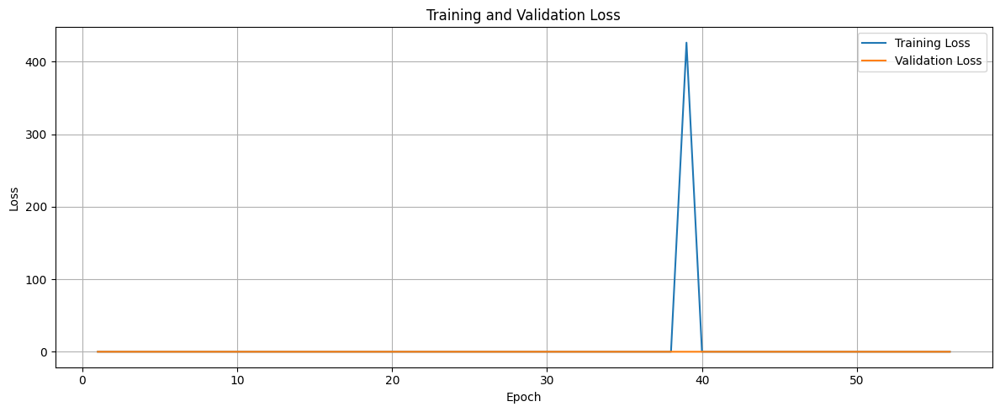

307/307 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step
y_pred_1day.shape = (9794, 24)
inv_y_pred_1day.shape = (9794, 24, 1)
inv_y_test_1day.shape = (9794, 24, 1)
Day = 0
mae: 1.870217714949794
mse: 5.728914828475404
rmse: 2.393515161530297
r2: 0.891569024232
mape: 0.10773188493877275
mnbe: -8.363884710518734
r_coeff: [0.98346921]


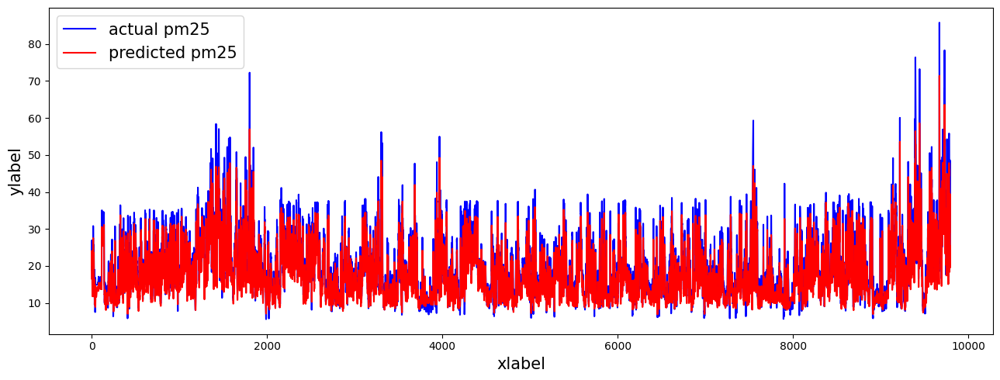

Day = 1
mae: 3.481028682860023
mse: 25.837800517057023
rmse: 5.083089662504197
r2: 0.3328331173549588
mape: 0.2011351372999666
mnbe: -11.133479562874404
r_coeff: [0.83814457]


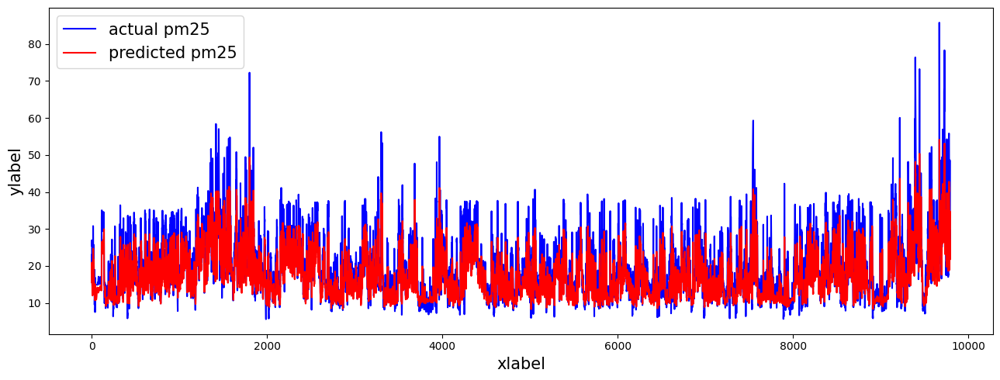

Day = 2
mae: 4.246803243920132
mse: 38.61248934844085
rmse: 6.213894861392559
r2: -0.22542308371274267
mape: 0.2488387635805234
mnbe: -12.083234754724204
r_coeff: [0.72421617]


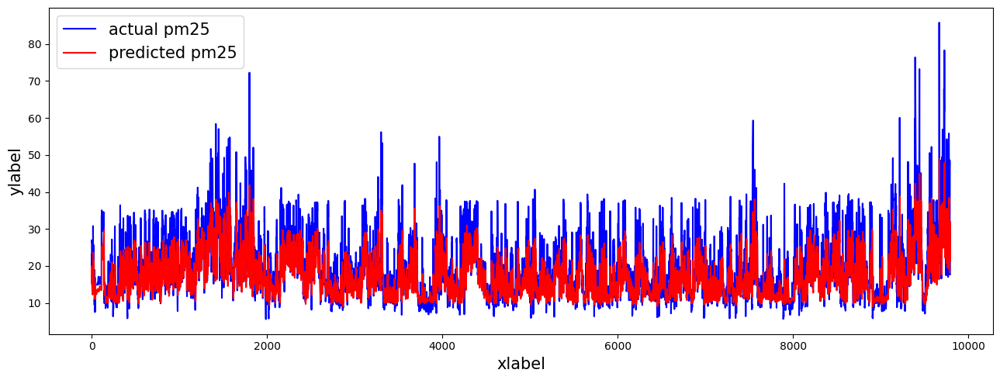

Day = 3
mae: 4.733430310444426
mse: 47.304912999314766
rmse: 6.87785671552663
r2: -0.8312966556438666
mape: 0.28122034040390187
mnbe: -12.6191370907557
r_coeff: [0.63597422]


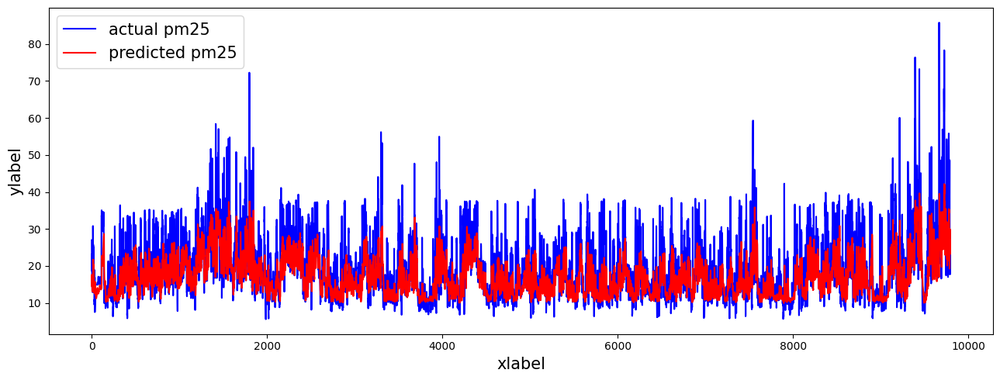

Day = 4
mae: 4.986473285297464
mse: 51.97020014647135
rmse: 7.209036006739829
r2: -1.3825518464053461
mape: 0.29300666080570015
mnbe: -11.279860331638217
r_coeff: [0.56522415]


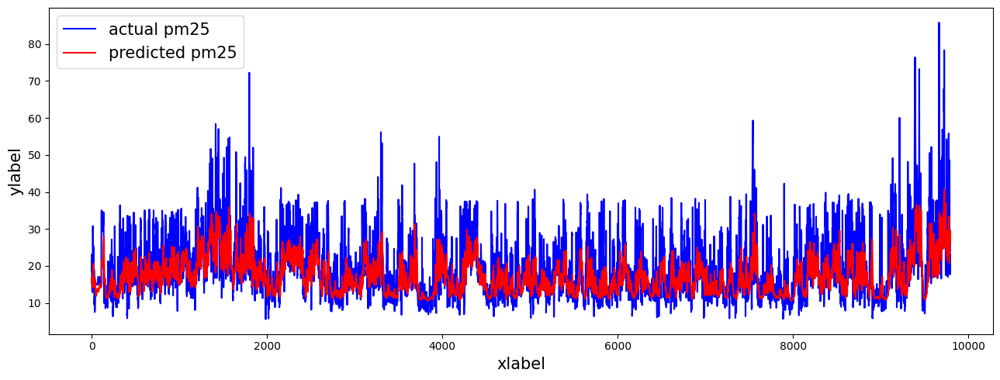

Day = 5
mae: 5.139879458045102
mse: 54.26797900593725
rmse: 7.3666803246738795
r2: -1.5064704065553345
mape: 0.30066883317664217
mnbe: -10.224461872810785
r_coeff: [0.52477142]


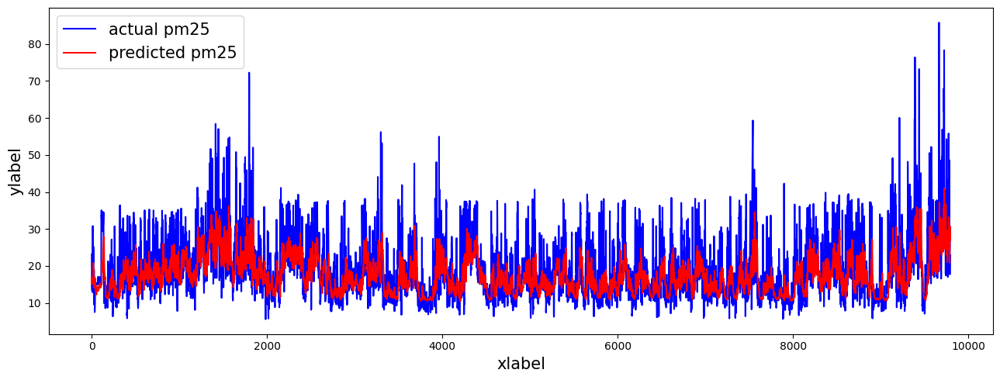

Day = 6
mae: 5.2626629987701365
mse: 56.74342584231672
rmse: 7.532823231851171
r2: -1.8264776308519926
mape: 0.3086624162630889
mnbe: -10.529566416750455
r_coeff: [0.49385181]


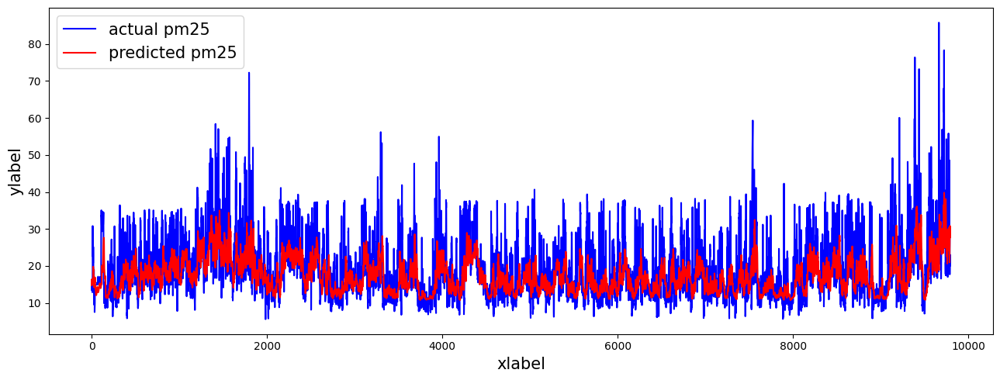

Day = 7
mae: 5.36255087043582
mse: 58.04666417206838
rmse: 7.618836142880904
r2: -1.9103010722683504
mape: 0.31336239583991393
mnbe: -9.643127103007062
r_coeff: [0.46728625]


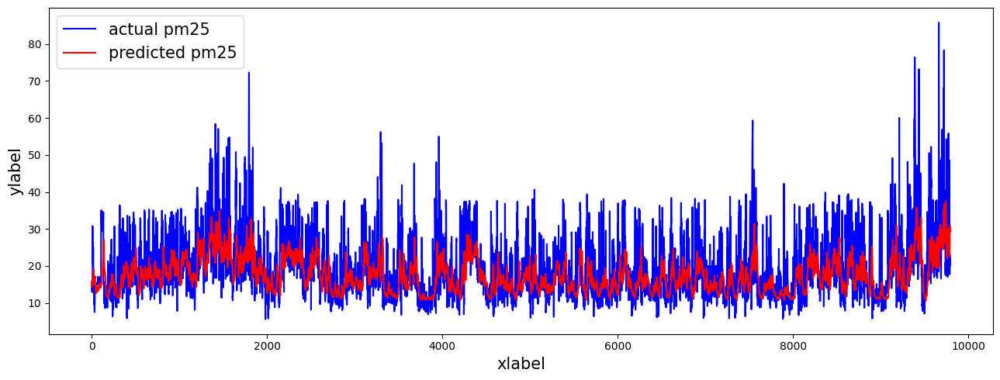

Day = 8
mae: 5.4129123427002686
mse: 59.68242290388758
rmse: 7.725439981249455
r2: -1.9977219901252274
mape: 0.3199960390239141
mnbe: -10.728882324019029
r_coeff: [0.45626475]


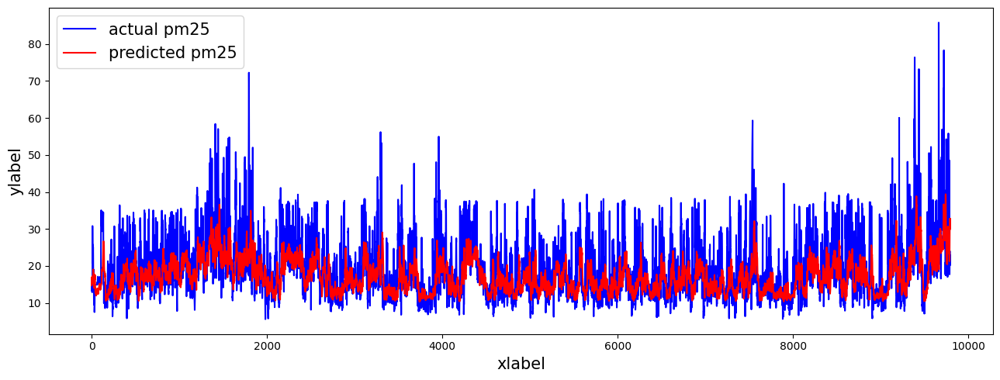

Day = 9
mae: 5.478687979829757
mse: 60.32606299522807
rmse: 7.766985450947367
r2: -1.7306215542186694
mape: 0.3228719397242026
mnbe: -9.936733247430999
r_coeff: [0.44505579]


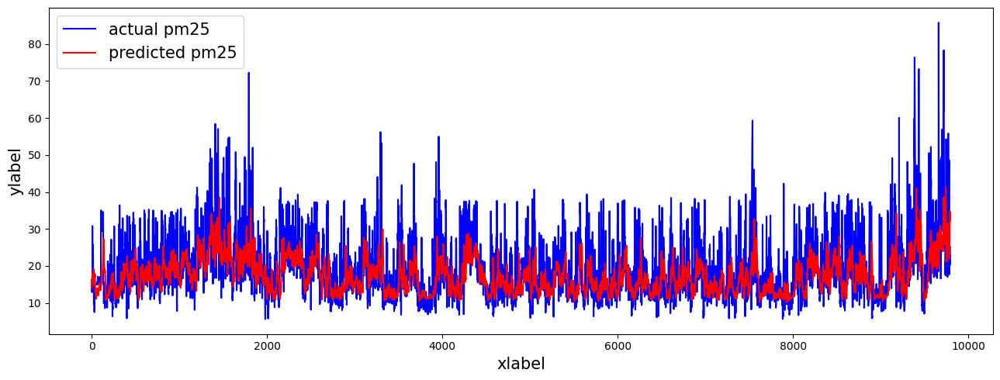

Day = 10
mae: 5.469412104301855
mse: 59.37881774108811
rmse: 7.705765227483129
r2: -2.0652840588564274
mape: 0.31469861249846287
mnbe: -8.153473887489463
r_coeff: [0.43487209]


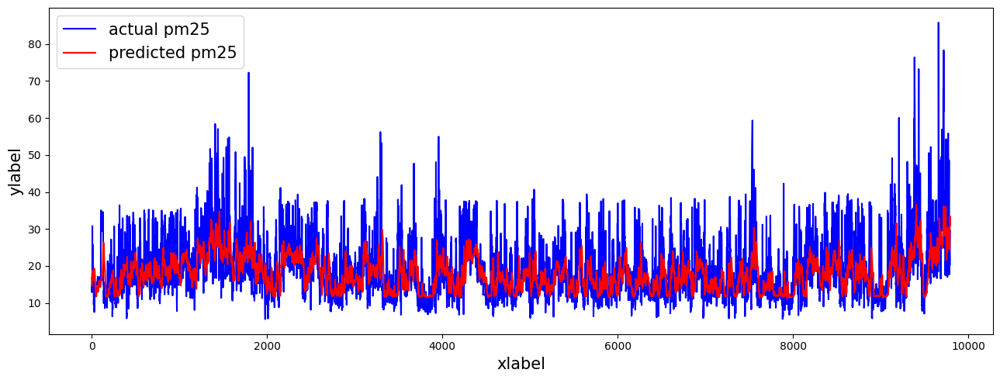

Day = 11
mae: 5.5396523465430025
mse: 61.117489801259495
rmse: 7.817767571452831
r2: -1.9771319382212371
mape: 0.3258182351413267
mnbe: -9.500487968071088
r_coeff: [0.4265019]


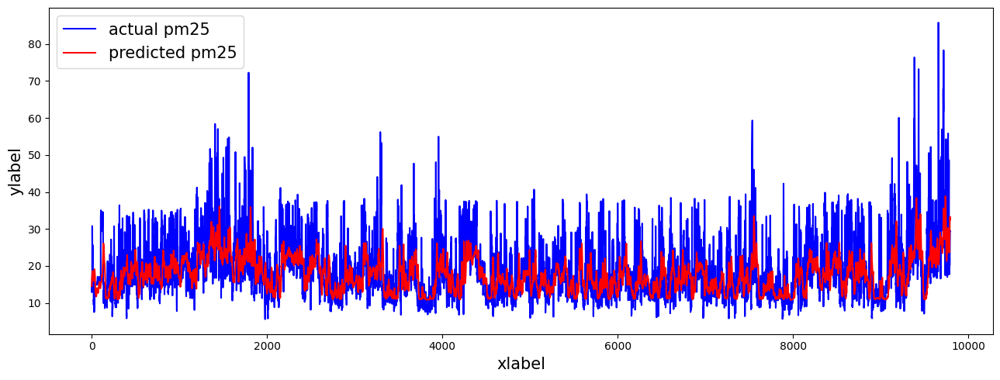

Day = 12
mae: 5.534963285749055
mse: 60.95126411266478
rmse: 7.807129057000709
r2: -2.280499824960972
mape: 0.3224138511887626
mnbe: -9.183593881335392
r_coeff: [0.42052298]


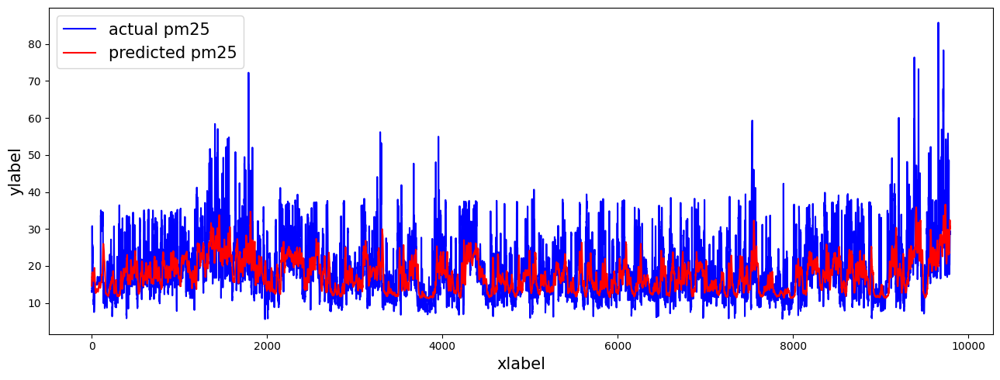

Day = 13
mae: 5.54283810370252
mse: 60.38121049326335
rmse: 7.770534762374038
r2: -2.1018986381881932
mape: 0.31785688760860337
mnbe: -7.908142133426174
r_coeff: [0.41974844]


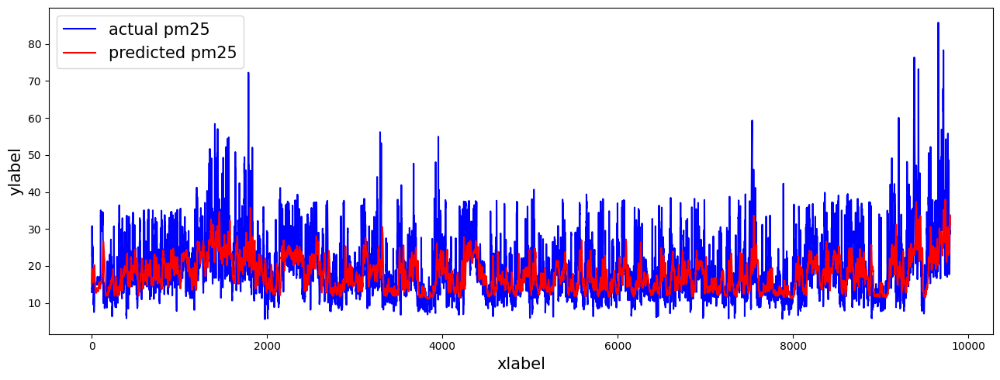

Day = 14
mae: 5.579849155830219
mse: 61.35763251440696
rmse: 7.833111292098878
r2: -2.2269339632237326
mape: 0.3246701330641446
mnbe: -8.785230901446596
r_coeff: [0.41256289]


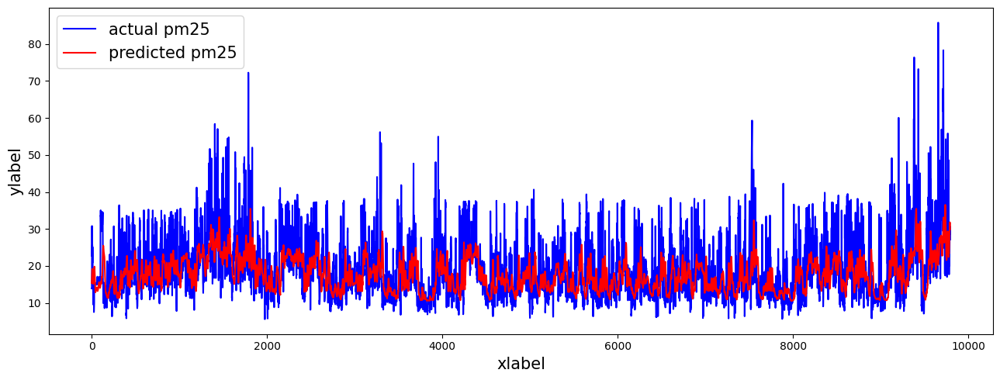

Day = 15
mae: 5.572429483481539
mse: 61.32965316881452
rmse: 7.831325122149796
r2: -2.6256847835871953
mape: 0.3224483682547982
mnbe: -8.915135066177472
r_coeff: [0.40842688]


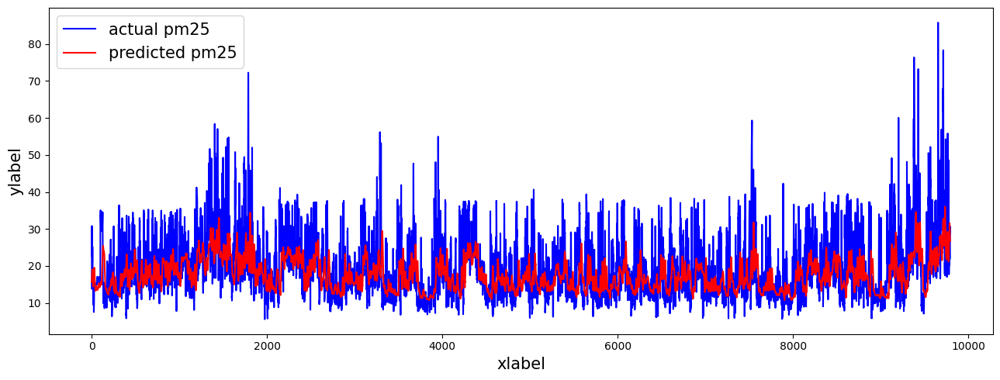

Day = 16
mae: 5.586157251792952
mse: 61.820116294626075
rmse: 7.862576949997124
r2: -2.6433491302167686
mape: 0.32601150005922236
mnbe: -9.566613358341126
r_coeff: [0.40796725]


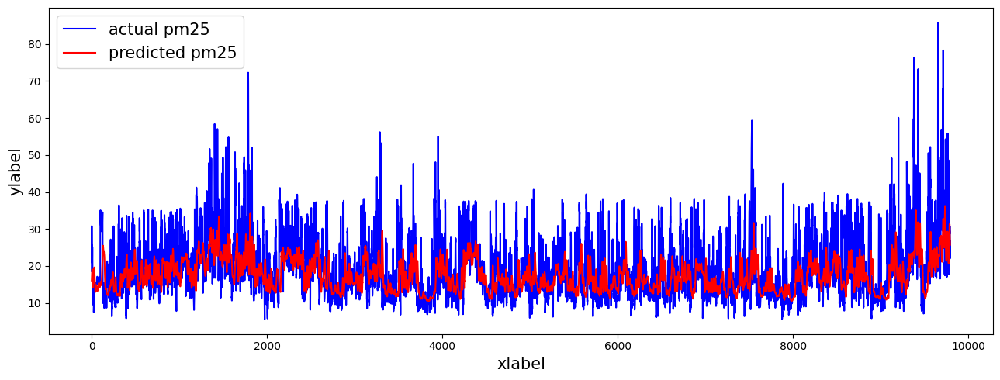

Day = 17
mae: 5.621889080623348
mse: 63.15454993222064
rmse: 7.946983700261417
r2: -2.6766180038506993
mape: 0.33569730277288684
mnbe: -11.147680547058103
r_coeff: [0.40686845]


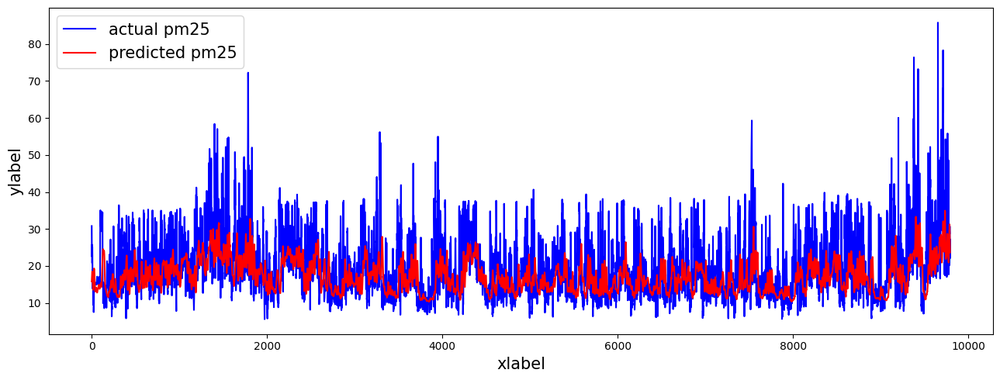

Day = 18
mae: 5.60524189037961
mse: 61.96358339523609
rmse: 7.8716950776332855
r2: -2.698353896876872
mape: 0.32709990170468073
mnbe: -9.656585044991749
r_coeff: [0.40648088]


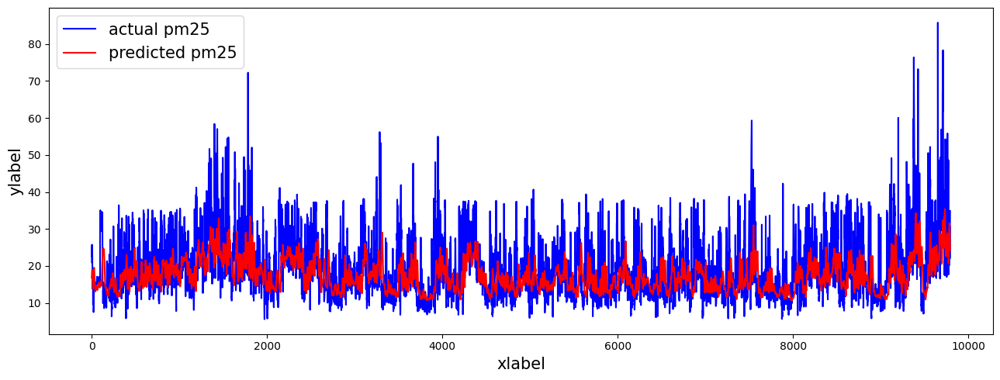

Day = 19
mae: 5.626956387171669
mse: 63.28295399861124
rmse: 7.955058390647503
r2: -2.7299631258398436
mape: 0.3350455415574135
mnbe: -10.996173273388086
r_coeff: [0.40311358]


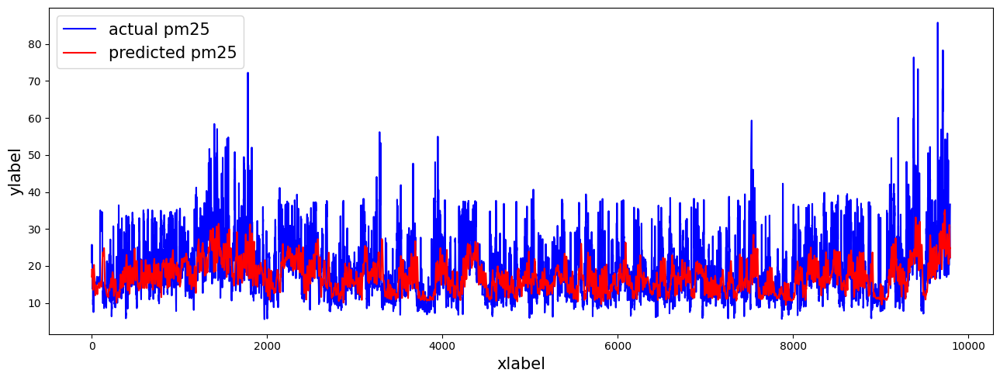

Day = 20
mae: 5.642347837511302
mse: 63.74619918510365
rmse: 7.98412169152648
r2: -2.911456607378857
mape: 0.3373903768424624
mnbe: -11.613203534940899
r_coeff: [0.40278427]


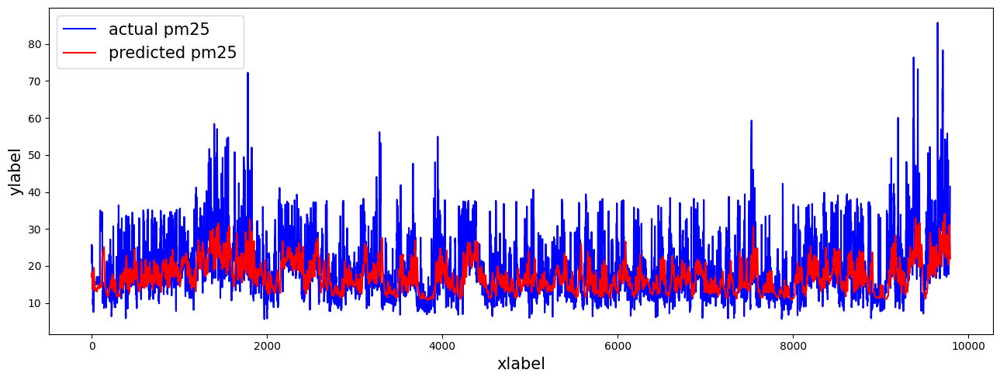

Day = 21
mae: 5.658106527510201
mse: 63.89699917775372
rmse: 7.993559856394003
r2: -2.8360149040550415
mape: 0.33732428316406415
mnbe: -11.087003835075146
r_coeff: [0.39611742]


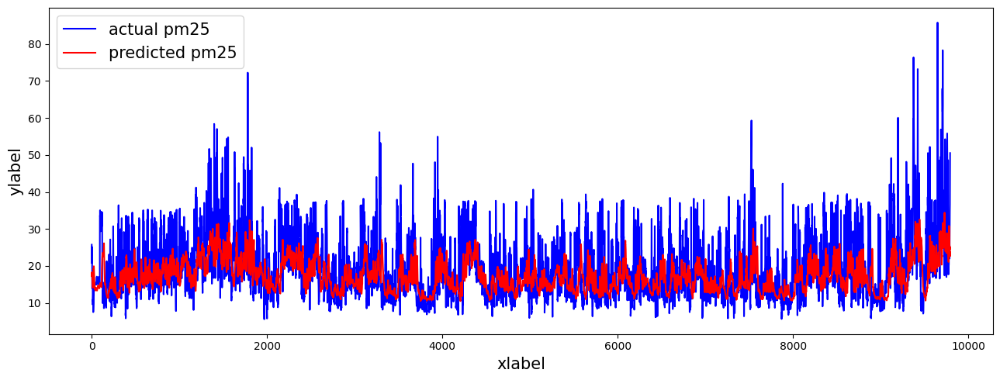

Day = 22
mae: 5.655392571355169
mse: 63.65082405829785
rmse: 7.978146655602281
r2: -2.8551159809347206
mape: 0.3340302216992141
mnbe: -10.478908969418125
r_coeff: [0.39368212]


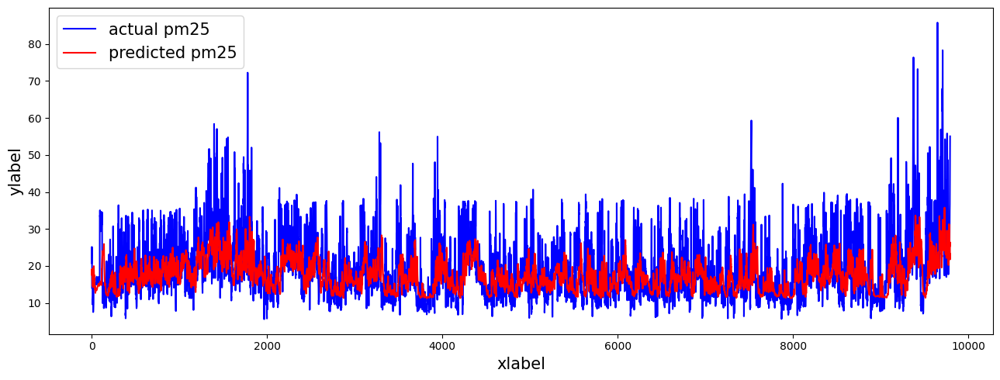

Day = 23
mae: 5.698671514297441
mse: 64.61775168950358
rmse: 8.0385167592973
r2: -2.745916449822036
mape: 0.34024298512100837
mnbe: -10.927980071560949
r_coeff: [0.38707885]


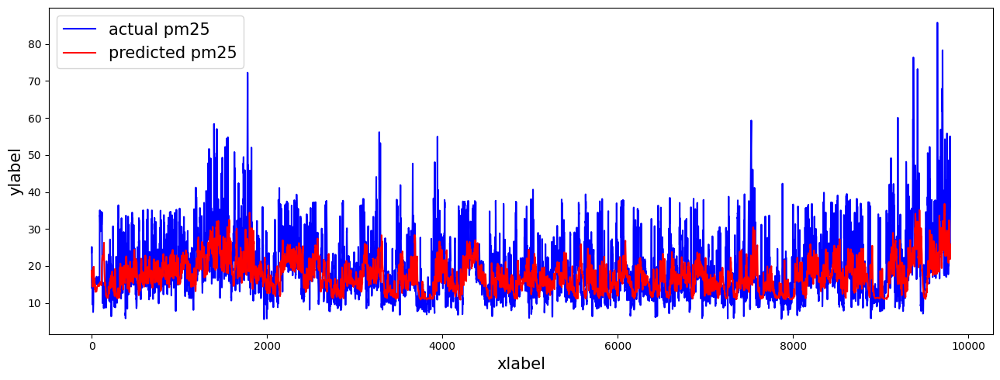

In [12]:
n_future = 24

lstms2s = define_lstms2s_model(n_past, n_future, X_train_1day.shape[-1], y_train_1day.shape[-1], f"lstms2s_{n_future}hours")

history = lstms2s.fit(X_train_1day, y_train_1day,
                epochs=epochs,
                batch_size=batch_size,
                validation_split=0.2,
                shuffle=False,
                callbacks = [reduce_lr_callback, early_stopping_callback],
                verbose=1)
plot_learning_curves(history)

# Predict data
y_pred_1day = lstms2s.predict(X_test_1day)
print(f"y_pred_1day.shape = {y_pred_1day.shape}")

inv_y_pred_1day = np.expand_dims(label_scaler.inverse_transform(y_pred_1day), -1)
inv_y_test_1day = np.expand_dims(label_scaler.inverse_transform(y_test_1day[:, :, 0]), -1)
print(f"inv_y_pred_1day.shape = {inv_y_pred_1day.shape}\ninv_y_test_1day.shape = {inv_y_test_1day.shape}")

# Evaluation
for day in range(n_future):
    print(f"Day = {day}")
    
    current_day_y_pred, current_day_y_test = inv_y_pred_1day[:, day, :], inv_y_test_1day[:, day, :]
    shifted_inv_y_pred, shifted_inv_y_test = current_day_y_pred[1:], current_day_y_test[:-1]
    
    for metric, calculator in metrics_calculators.items():
        print(f"{metric}: {calculator(shifted_inv_y_pred, shifted_inv_y_test)}")
    plot_2_data(data1=shifted_inv_y_test, datalabel1="actual pm25", data2=shifted_inv_y_pred, datalabel2="predicted pm25")

### GRU-Seq2Seq

In [15]:
def define_grus2s_model(n_past, n_future, n_features, n_label, name="model"):
    inputs = Input(shape=(n_past, n_features))
    gru_1 = GRU(128, return_sequences=True, activation="relu")(inputs)
    gru_2 = GRU(64, activation="relu", dropout=0.2)(gru_1)
    dense = Dense(32, activation="relu")(gru_2)
    outputs = Dense(n_future)(dense)

    # Compile the model
    model = Model(inputs, outputs)
    model.name = name
    model.compile(optimizer=Adam(learning_rate=0.001), loss=MeanAbsoluteError())
    display(model.summary())
    return model

#### 24 hours

Model: "grus2s_24hours"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 168, 2)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_2 (GRU)                     │ (None, 168, 128)       │        50,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_3 (GRU)                     │ (None, 64)             │        37,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 24)             │           792 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 90,808 (354.72 KB)

 Trainable params: 90,808 (354.72 KB)

 Non-trainable params: 0 (0.00 B)

None

Epoch 1/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.0526 - val_loss: 0.0315 - learning_rate: 0.0010
Epoch 2/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 43ms/step - loss: 0.0481 - val_loss: 0.0299 - learning_rate: 0.0010
Epoch 3/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 43ms/step - loss: 0.0480 - val_loss: 0.0289 - learning_rate: 0.0010
Epoch 4/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.0465 - val_loss: 0.0286 - learning_rate: 0.0010
Epoch 5/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0447
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
249/249 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - loss: 0.0453 - val_loss: 0.0281 - learning_rate: 0.0010
Epoch 6/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step - loss: 0.0446 - val_loss: 0.0276 - learning_rate: 5.0000e-04
Epoch 7/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step - loss: 0.0431 - val_loss: 0.0267 - learning_rate: 5.0000e-04
Epoch 8/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.042

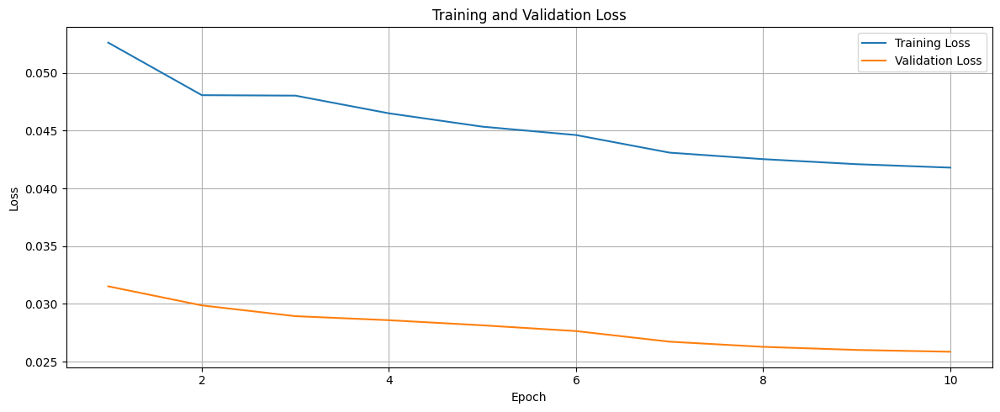

307/307 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step
y_pred_1day.shape = (9794, 24)
inv_y_pred_1day.shape = (9794, 24, 1)
inv_y_test_1day.shape = (9794, 24, 1)
Day = 0
mae: 9.182905617886439
mse: 140.88536276344797
rmse: 11.869514007045444
r2: -263.0076983615703
mape: 0.8623782602842048
mnbe: -47.002400212025904
r_coeff: [0.90458781]


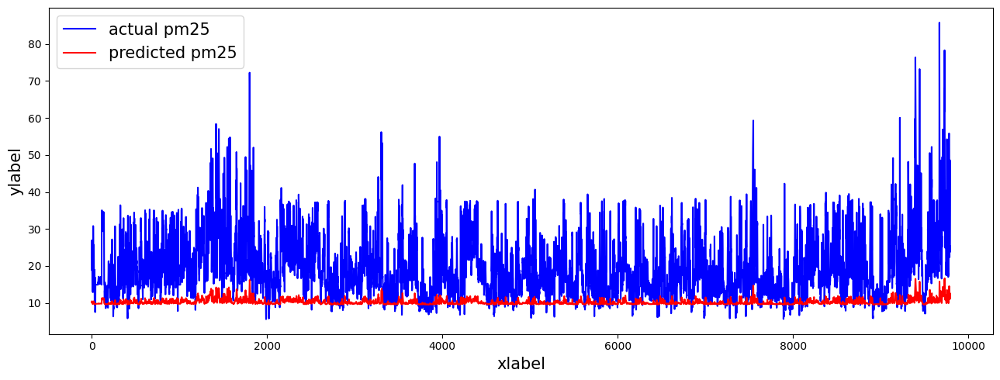

Day = 1
mae: 7.969021378333927
mse: 117.98585494651543
rmse: 10.862129392826962
r2: -224.4346579758534
mape: 0.6584090714023129
mnbe: -39.34620625901551
r_coeff: [0.77954158]


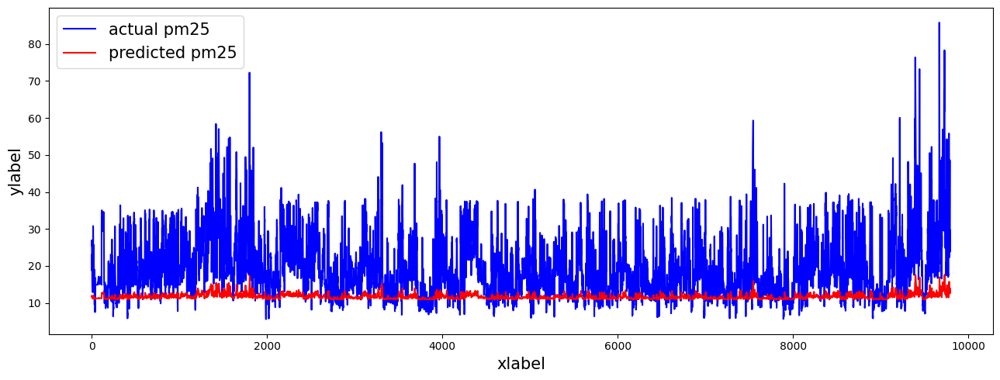

Day = 2
mae: 7.833007364576759
mse: 116.82237936411053
rmse: 10.808440191078013
r2: -328.06025784108704
mape: 0.6402283583648777
mnbe: -38.00684494562862
r_coeff: [0.65898067]


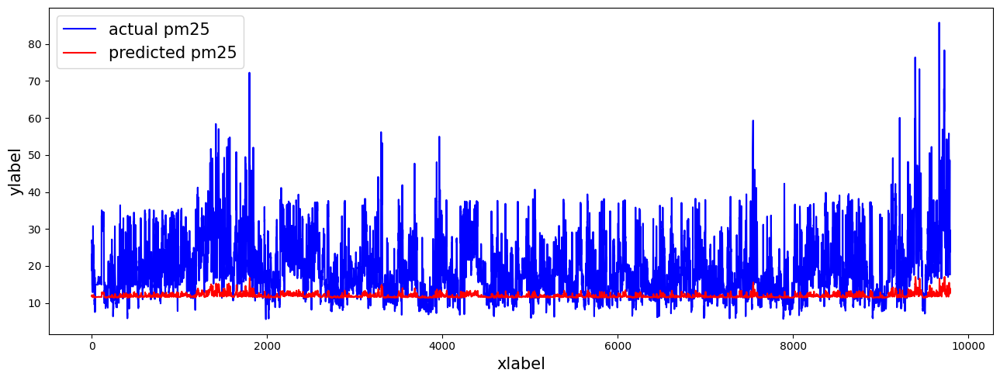

Day = 3
mae: 7.825514274783676
mse: 118.06839592366511
rmse: 10.865928212705304
r2: -501.8075163677605
mape: 0.6420119899318415
mnbe: -37.84125752476093
r_coeff: [0.58271168]


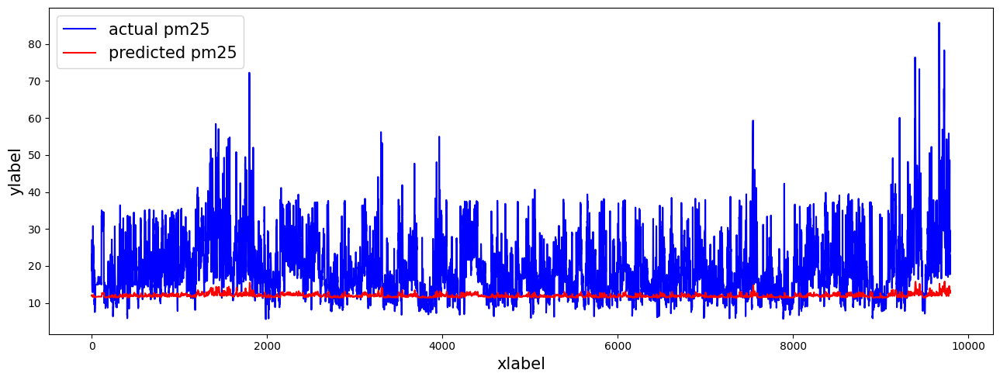

Day = 4
mae: 7.921648347135851
mse: 120.45525454903441
rmse: 10.975210911369057
r2: -593.4076121827914
mape: 0.6580780401656591
mnbe: -38.352477074175546
r_coeff: [0.4964604]


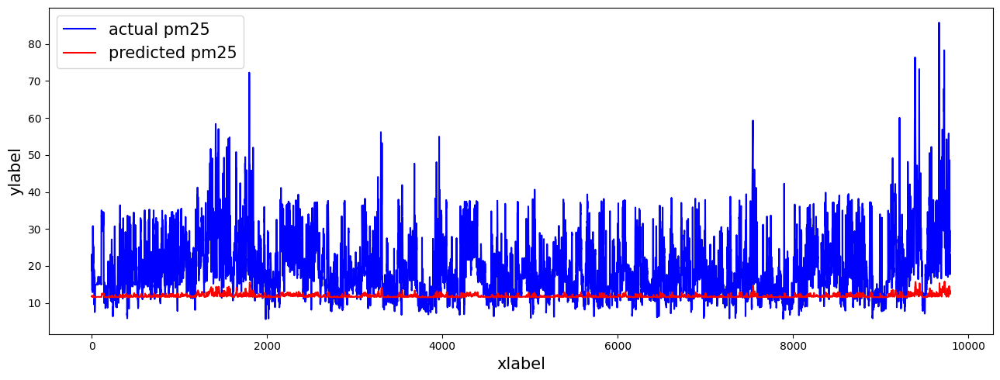

Day = 5
mae: 8.189106587859165
mse: 127.36897157666974
rmse: 11.285786263112984
r2: -2541.9656383801325
mape: 0.7046139915214392
mnbe: -40.07558895369225
r_coeff: [0.44847879]


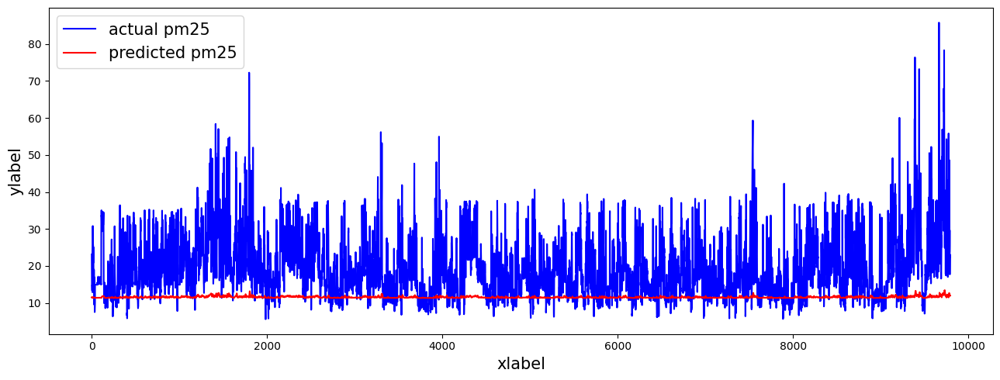

Day = 6
mae: 10.497511102452778
mse: 174.7002917145452
rmse: 13.217423792651319
r2: -427.04444604930893
mape: 1.1768735879864411
mnbe: -54.282267674299156
r_coeff: [0.41376024]


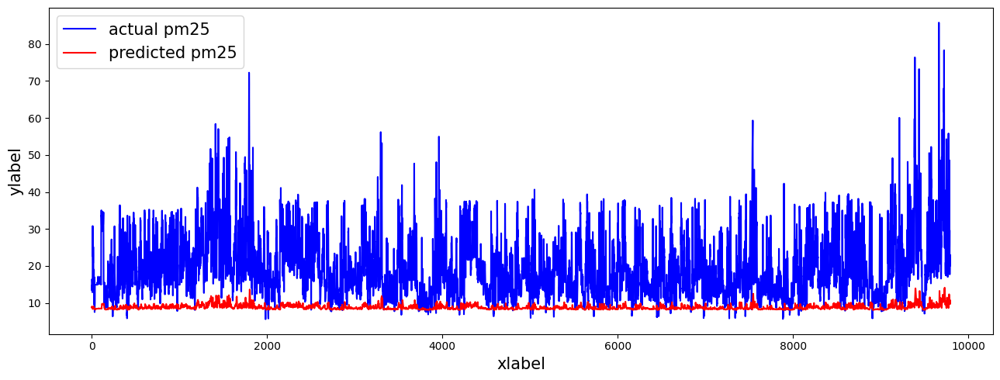

Day = 7
mae: 7.3701638087296475
mse: 109.73225207336296
rmse: 10.475316323307997
r2: -3852.979173507389
mape: 0.5721517039644648
mnbe: -33.380476237482306
r_coeff: [0.37291407]


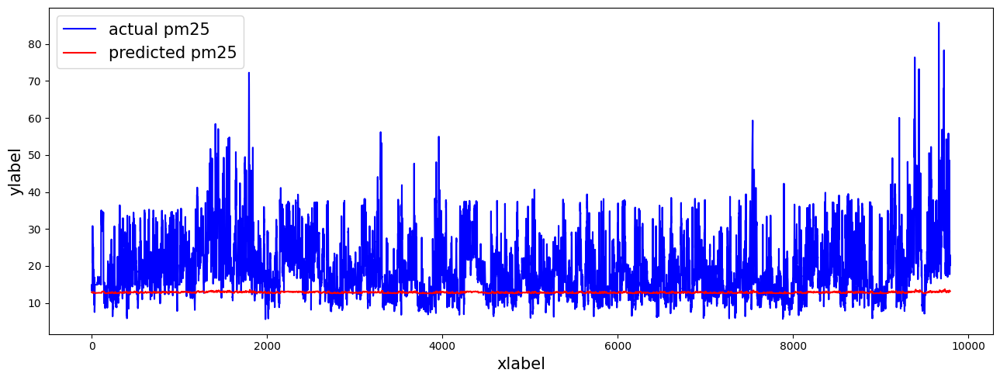

Day = 8
mae: 9.573546522025595
mse: 156.404930476572
rmse: 12.506195683603067
r2: -937.7654612671549
mape: 0.9671698345850975
mnbe: -49.03221996921962
r_coeff: [0.34654926]


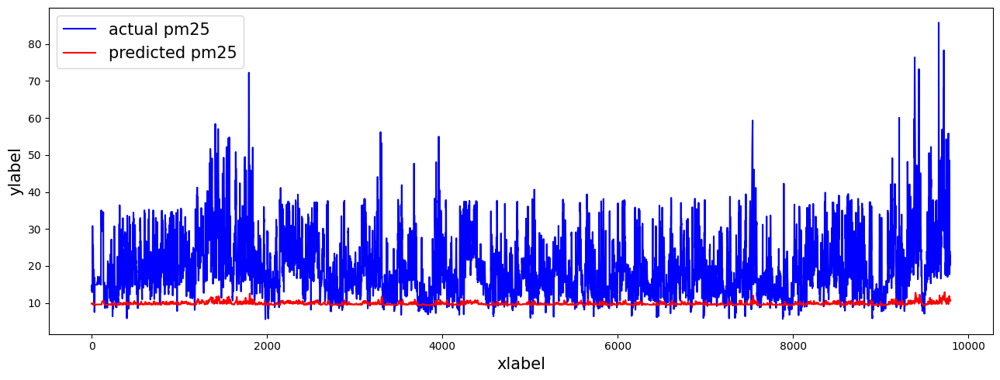

Day = 9
mae: 7.938102823038609
mse: 121.70816231641882
rmse: 11.032142236049117
r2: -460.32330623904727
mape: 0.6636860921759398
mnbe: -38.354525804699996
r_coeff: [0.29824633]


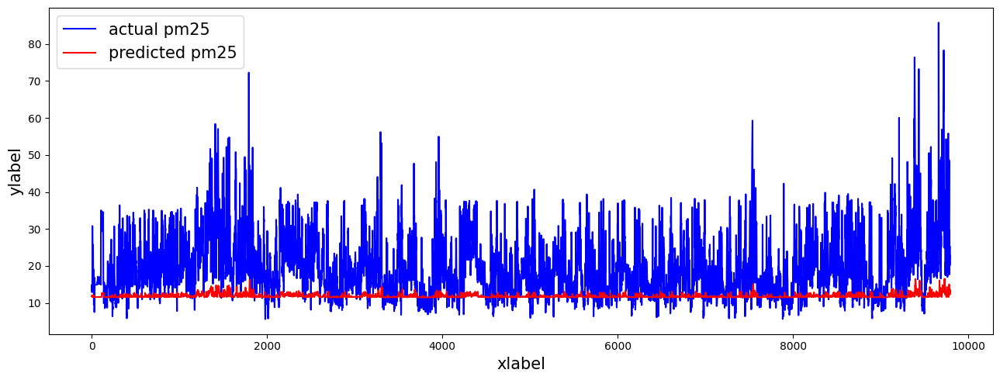

Day = 10
mae: 7.753148006168509
mse: 118.31041235897979
rmse: 10.87705899400108
r2: -3946.4863670759773
mape: 0.6328184722678961
mnbe: -36.6420539327518
r_coeff: [0.33583783]


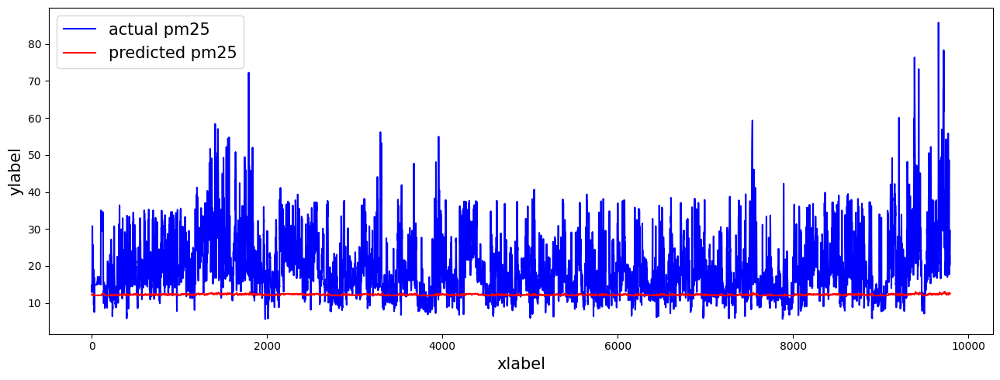

Day = 11
mae: 8.15170076624162
mse: 126.26310367994753
rmse: 11.236685618096981
r2: -496.58730880946234
mape: 0.6988100398410718
mnbe: -39.94382509179536
r_coeff: [0.31423077]


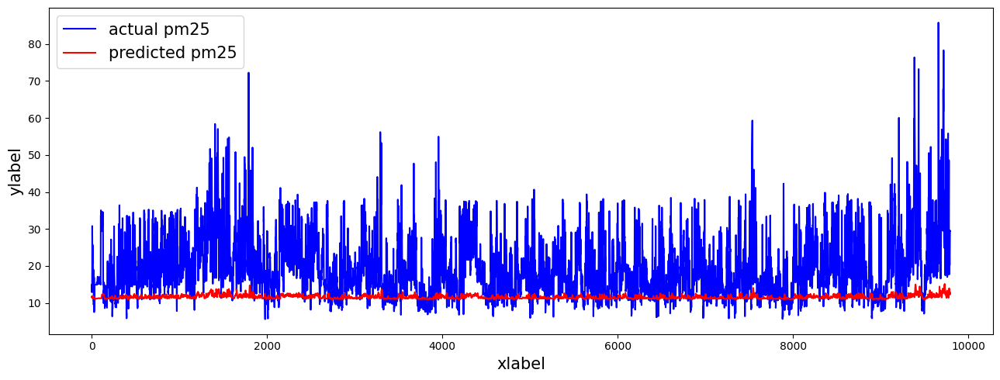

Day = 12
mae: 8.394782843783386
mse: 131.55288345412094
rmse: 11.469650537576154
r2: -655.1422584701203
mape: 0.740434638341392
mnbe: -41.5774996635022
r_coeff: [0.30188484]


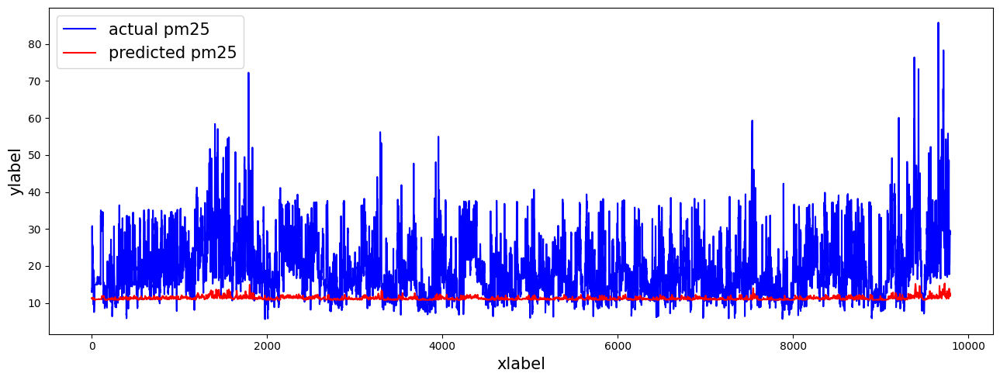

Day = 13
mae: 7.27459816821381
mse: 107.2657060168673
rmse: 10.356915854484253
r2: -953.9915438057817
mape: 0.5568452274667224
mnbe: -32.61326469676965
r_coeff: [0.32019618]


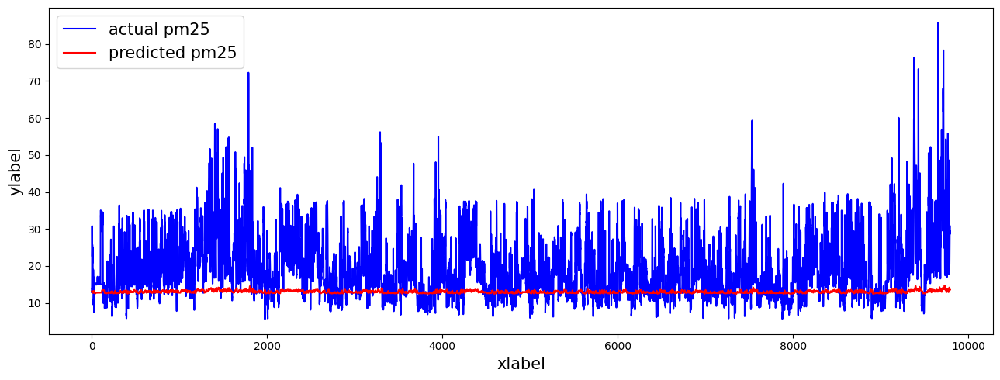

Day = 14
mae: 9.054423276766654
mse: 145.51899507598102
rmse: 12.063125427350121
r2: -937.2226836337074
mape: 0.8610605808358672
mnbe: -45.84646703576833
r_coeff: [0.32435539]


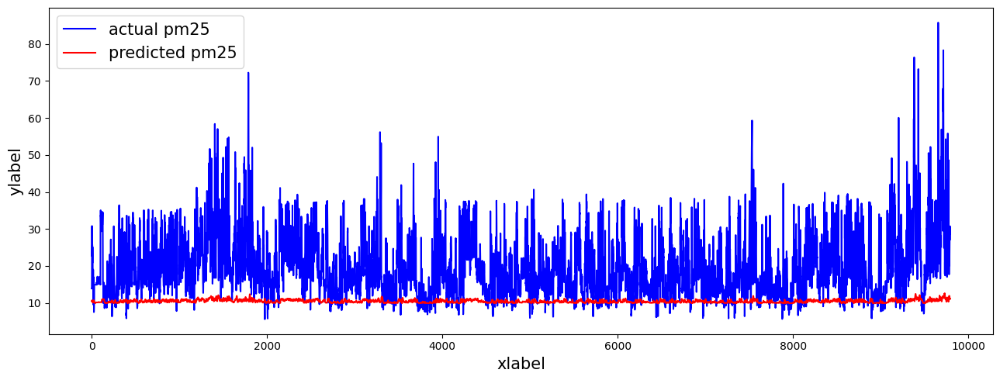

Day = 15
mae: 8.853821746129029
mse: 142.09769172113215
rmse: 11.92047363661076
r2: -6534.106959789916
mape: 0.8245036101454017
mnbe: -44.45706845569255
r_coeff: [0.3107369]


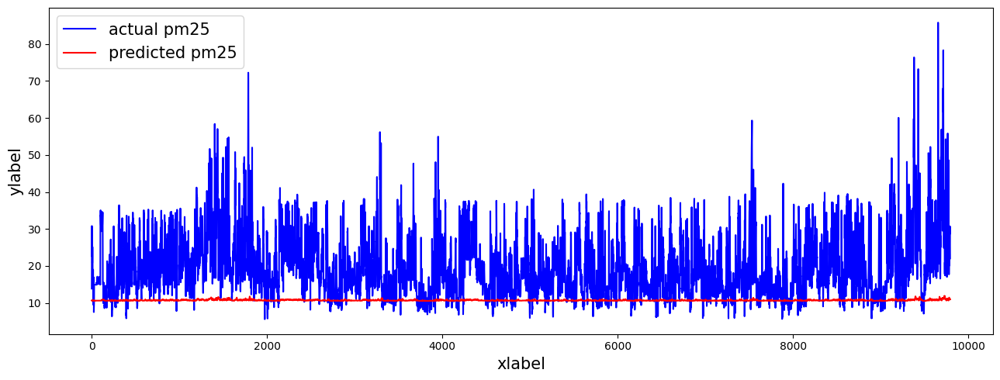

Day = 16
mae: 9.161419501458141
mse: 147.11196151557039
rmse: 12.128971989231832
r2: -463.7487898025521
mape: 0.8809246125549332
mnbe: -46.53431894599344
r_coeff: [0.3279256]


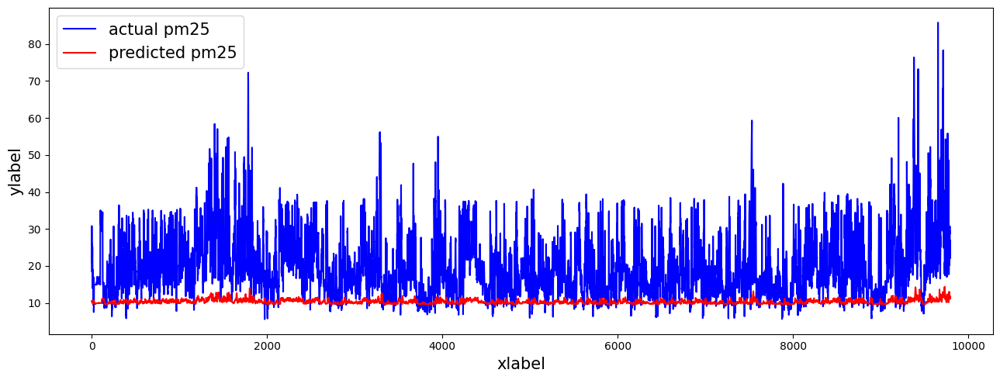

Day = 17
mae: 10.084455441651118
mse: 166.61730973949253
rmse: 12.908032760242458
r2: -490.0431825849506
mape: 1.0780591830119184
mnbe: -51.91124671158788
r_coeff: [0.33599293]


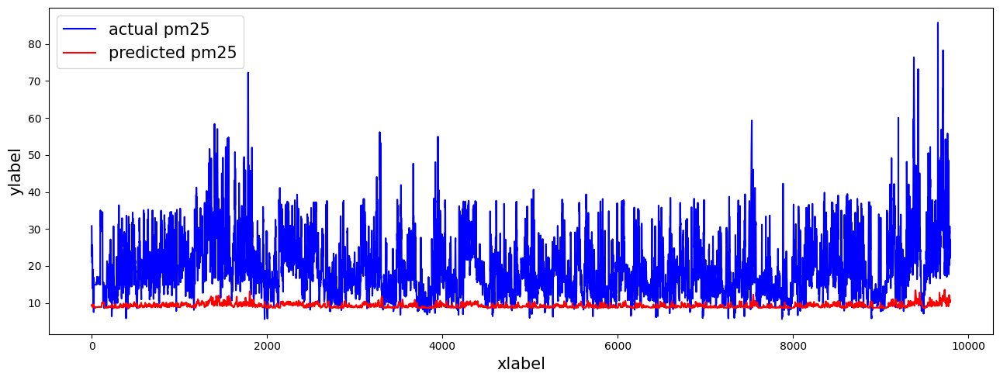

Day = 18
mae: 8.875026333064527
mse: 141.35166955397744
rmse: 11.889140824886272
r2: -800.7897490769419
mape: 0.8251915129904702
mnbe: -44.706274024229074
r_coeff: [0.36142992]


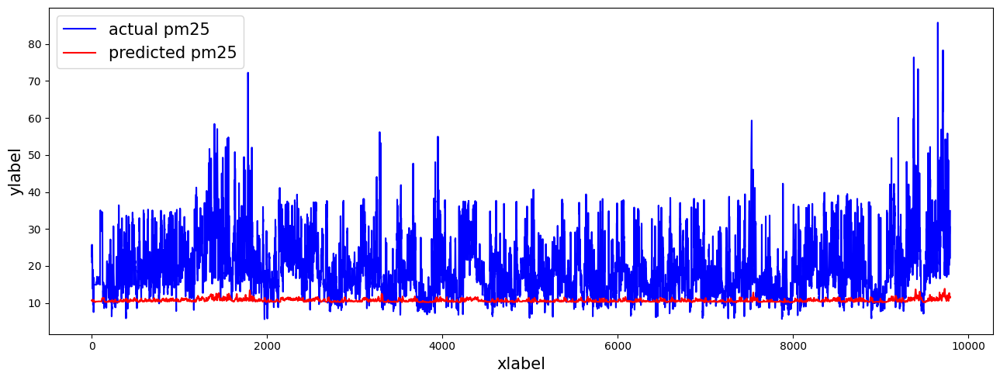

Day = 19
mae: 9.410204061897375
mse: 152.50605190679258
rmse: 12.349334067341145
r2: -680.6193971470879
mape: 0.9299560754239095
mnbe: -47.99238180836895
r_coeff: [0.35192729]


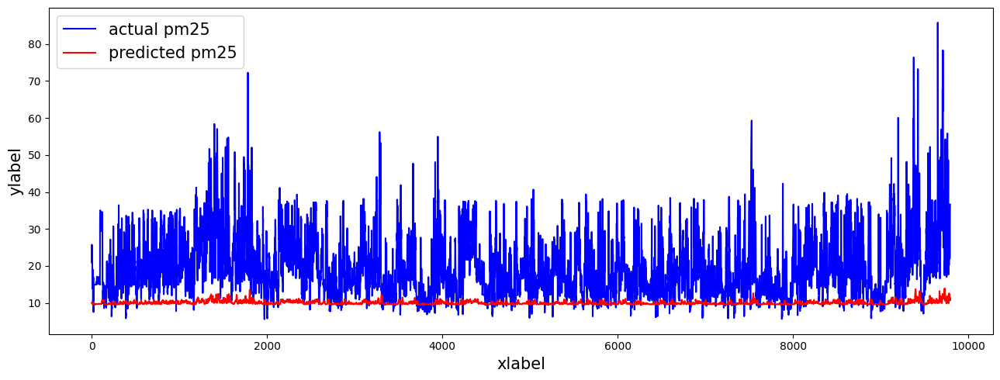

Day = 20
mae: 8.6827894341748
mse: 137.869917702768
rmse: 11.741802148851257
r2: -1913.1373154097396
mape: 0.7901386404393382
mnbe: -43.39673460696345
r_coeff: [0.38523043]


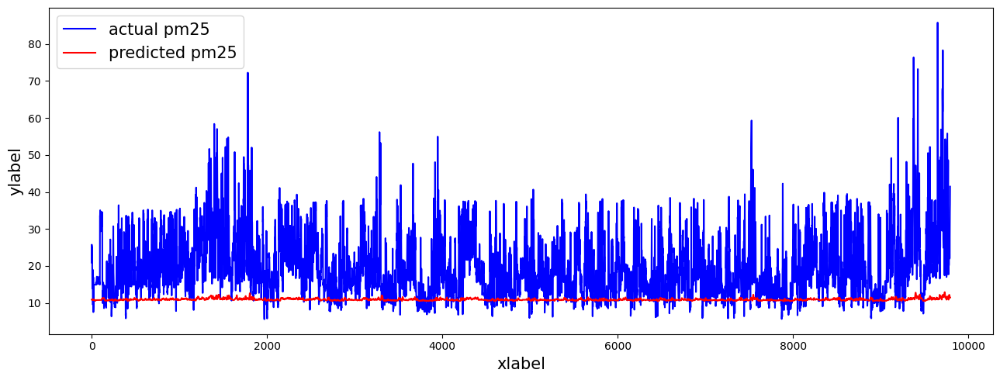

Day = 21
mae: 9.26158916716473
mse: 148.06988285413192
rmse: 12.16839688924272
r2: -220.37377645682477
mape: 0.8985996318511523
mnbe: -47.1386327697305
r_coeff: [0.35338336]


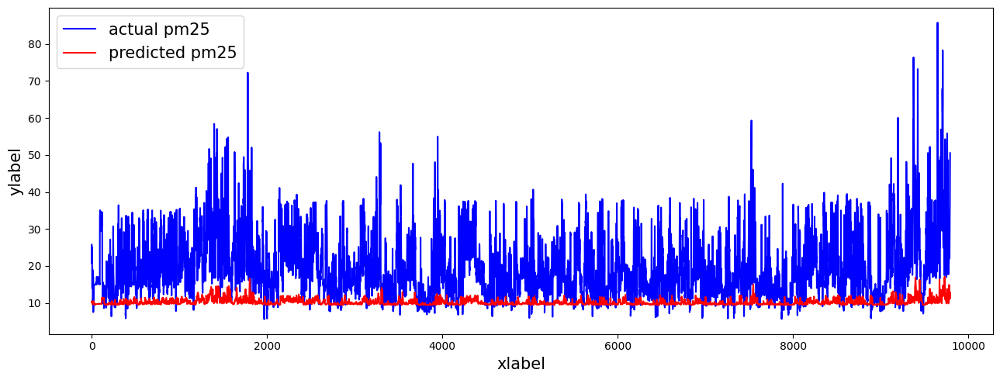

Day = 22
mae: 8.995690732990454
mse: 144.91830464654848
rmse: 12.038201885935809
r2: -2868.084551297062
mape: 0.8487955295787397
mnbe: -45.36459764843577
r_coeff: [0.37549169]


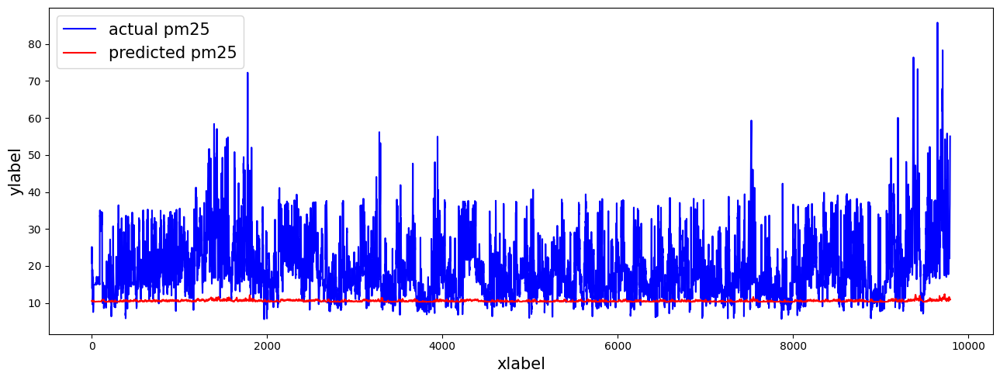

Day = 23
mae: 8.156913536012262
mse: 125.99848865964731
rmse: 11.224904839670014
r2: -479.89299413534917
mape: 0.696048256801273
mnbe: -39.819017285495114
r_coeff: [0.34966941]


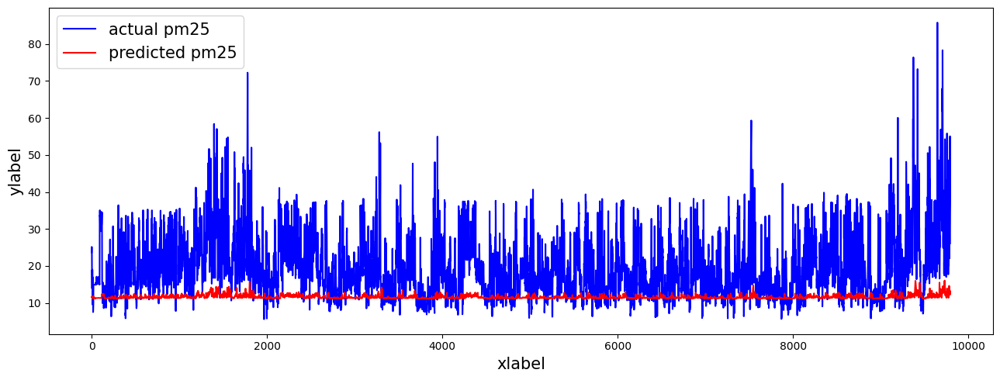

In [16]:
n_future = 24

grus2s = define_grus2s_model(n_past, n_future, X_train_1day.shape[-1], y_train_1day.shape[-1], f"grus2s_{n_future}hours")

history = grus2s.fit(X_train_1day, y_train_1day,
                epochs=epochs,
                batch_size=batch_size,
                validation_split=0.2,
                shuffle=False,
                callbacks = [reduce_lr_callback, early_stopping_callback],
                verbose=1)
plot_learning_curves(history)

# Predict data
y_pred_1day = grus2s.predict(X_test_1day)
print(f"y_pred_1day.shape = {y_pred_1day.shape}")

inv_y_pred_1day = np.expand_dims(label_scaler.inverse_transform(y_pred_1day), -1)
inv_y_test_1day = np.expand_dims(label_scaler.inverse_transform(y_test_1day[:, :, 0]), -1)
print(f"inv_y_pred_1day.shape = {inv_y_pred_1day.shape}\ninv_y_test_1day.shape = {inv_y_test_1day.shape}")

# Evaluation
for day in range(n_future):
    print(f"Day = {day}")
    
    current_day_y_pred, current_day_y_test = inv_y_pred_1day[:, day, :], inv_y_test_1day[:, day, :]
    shifted_inv_y_pred, shifted_inv_y_test = current_day_y_pred[1:], current_day_y_test[:-1]
    
    for metric, calculator in metrics_calculators.items():
        print(f"{metric}: {calculator(shifted_inv_y_pred, shifted_inv_y_test)}")
    plot_2_data(data1=shifted_inv_y_test, datalabel1="actual pm25", data2=shifted_inv_y_pred, datalabel2="predicted pm25")